In [32]:
import os
import cv2
import numpy as np
import xml.etree.ElementTree as ET

# Folder paths
image_folder = 'dataset/images'
annotation_folder = 'dataset/annotations'

# Preprocessing parameters
img_size = (64, 64)  # Resize images to 64x64

def load_images_and_labels(image_folder, annotation_folder, img_size):
    images = []
    labels = []  # 0 for 'without mask', 1 for 'with mask', 2 for 'mask weared incorrect'
    for img_file in os.listdir(image_folder):
        # Image path
        img_path = os.path.join(image_folder, img_file)
        
        # Annotation path
        xml_file = img_file.split('.')[0] + '.xml'
        xml_path = os.path.join(annotation_folder, xml_file)
        
        # Read and preprocess image
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)  # Convert to grayscale
        img = cv2.resize(img, img_size)
        img = img.flatten()  # Flatten the image to a 1D array
        images.append(img)
        
        # Parse XML for label
        label = 0  # Default to 'without mask'
        tree = ET.parse(xml_path)
        root = tree.getroot()
        for obj in root.findall('object'):
            name = obj.find('name').text
            if name == 'with_mask':
                label = 1
                break
            elif name == 'mask_weared_incorrect':
                label = 2
                break
        labels.append(label)
        
    return np.array(images), np.array(labels)

images, labels = load_images_and_labels(image_folder, annotation_folder, img_size)



In [33]:
from sklearn.model_selection import train_test_split

# Splitting the dataset into the Training set and Test set
X_train, X_test, y_train, y_test = train_test_split(images, labels, test_size=0.2, random_state=42)


In [34]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Standardizing the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Applying PCA
pca = PCA(n_components=0.95)  # Adjust based on your dataset and requirements
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)


In [35]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report

# Training the Random Forest model
rfc_model = RandomForestClassifier(n_estimators=100, random_state=42)
rfc_model.fit(X_train_pca, y_train)


# Predicting the Test set results
rfc_model_predicitions = rfc_model.predict(X_test_pca)

# Making the Classification Report with zero_division parameter set to 0
print(classification_report(y_test, rfc_model_predicitions, target_names=['without mask', 'with mask', 'mask weared incorrect'], zero_division=0))

                       precision    recall  f1-score   support

         without mask       0.00      0.00      0.00        12
            with mask       0.92      1.00      0.96       157
mask weared incorrect       0.00      0.00      0.00         2

             accuracy                           0.92       171
            macro avg       0.31      0.33      0.32       171
         weighted avg       0.84      0.92      0.88       171



In [36]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report

# Training the KNeighborsClassifier model
knn_model = KNeighborsClassifier(n_neighbors=3)
knn_model.fit(X_train_pca, y_train) 

# Predicting the Test set results
knn_predictions = knn_model.predict(X_test_pca)

print(classification_report(y_test, knn_predictions))


              precision    recall  f1-score   support

           0       0.19      0.42      0.26        12
           1       0.94      0.86      0.90       157
           2       0.00      0.00      0.00         2

    accuracy                           0.82       171
   macro avg       0.38      0.43      0.39       171
weighted avg       0.88      0.82      0.84       171



In [37]:
from sklearn.svm import SVC
from sklearn.metrics import classification_report

# Training the SVC model
svm_model_linear = SVC(kernel='linear')  
svm_model_linear.fit(X_train_pca, y_train)

# Predicting the Test set results
svm_predictions_linear = svm_model_linear.predict(X_test_pca)

print(classification_report(y_test, svm_predictions_linear))


              precision    recall  f1-score   support

           0       0.31      0.33      0.32        12
           1       0.94      0.91      0.93       157
           2       0.17      0.50      0.25         2

    accuracy                           0.87       171
   macro avg       0.47      0.58      0.50       171
weighted avg       0.89      0.87      0.88       171



In [38]:
from sklearn.svm import SVC
from sklearn.metrics import classification_report

# Training the SVC model
svm_model_rbf = SVC(kernel='rbf')
svm_model_rbf.fit(X_train_pca, y_train)

# Predicting the Test set results
svm_predictions_rbf = svm_model_rbf.predict(X_test_pca)

# Use zero_division=0 to handle classes with no predictions
print(classification_report(y_test, svm_predictions_rbf, target_names=['without mask', 'with mask', 'mask weared incorrect'], zero_division=0))


                       precision    recall  f1-score   support

         without mask       0.00      0.00      0.00        12
            with mask       0.92      1.00      0.96       157
mask weared incorrect       0.00      0.00      0.00         2

             accuracy                           0.92       171
            macro avg       0.31      0.33      0.32       171
         weighted avg       0.84      0.92      0.88       171



In [39]:
from sklearn.svm import SVC
from sklearn.metrics import classification_report

# Training the SVC model
svm_model_poly = SVC(kernel='poly')  
svm_model_poly.fit(X_train_pca, y_train)

# Predicting the Test set results
svm_predictions_poly = svm_model_poly.predict(X_test_pca)

print(classification_report(y_test, svm_predictions_poly))

              precision    recall  f1-score   support

           0       0.67      0.17      0.27        12
           1       0.93      0.99      0.96       157
           2       0.00      0.00      0.00         2

    accuracy                           0.92       171
   macro avg       0.53      0.38      0.41       171
weighted avg       0.90      0.92      0.90       171



In [40]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report



# Initialize the Logistic Regression model with a higher number of iterations
log_reg = LogisticRegression(max_iter=1000)

# Fit the model on the PCA-transformed training data
log_reg.fit(X_train_pca, y_train)

# Make predictions on the PCA-transformed test data
log_reg_predictions = log_reg.predict(X_test_pca)

# Generate and print the classification report to evaluate the model
print(classification_report(y_test, log_reg_predictions))


              precision    recall  f1-score   support

           0       0.40      0.33      0.36        12
           1       0.94      0.94      0.94       157
           2       0.20      0.50      0.29         2

    accuracy                           0.89       171
   macro avg       0.51      0.59      0.53       171
weighted avg       0.90      0.89      0.89       171



In [41]:

# !!! DEEP LEARNING METHOD WITH APPLYING tenserflow and CNN model !!! 
# !!! It has not been taken into account as the project was totally done with Machine Learning !!!
# !!! Model was just tested to see difference !!!

# DO NOT uncomment and run the cell.


# from sklearn.neural_network import MLPClassifier
# from sklearn.metrics import classification_report


# # Shallow Neural Network
# mlp_model = MLPClassifier(hidden_layer_sizes=(100,), max_iter=500)
# mlp_model.fit(X_train_scaled, y_train)  # Use scaled data, not PCA-transformed
# mlp_predictions = mlp_model.predict(X_test_scaled)

# print(classification_report(y_test, mlp_predictions))


# from tensorflow.keras.models import Sequential
# from tensorflow.keras.layers import Dense, Flatten

# # Create a simple deep neural network for illustration
# model = Sequential([
#     Flatten(input_shape=(X_train_pca.shape[1],)),  # Adjust based on your PCA output shape
#     Dense(128, activation='relu'),
#     Dense(3, activation='softmax')  # Assuming 3 classes
# ])

# model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
# model.fit(X_train_pca, y_train, epochs=10, validation_split=0.2)

# # Evaluate the model
# model.evaluate(X_test_pca, y_test)


In [42]:
import joblib

# Save the PCA transformer
joblib.dump(pca, 'models/pca_transformer.joblib')

# Save the scaler
joblib.dump(scaler, 'models/scaler.joblib')

# Save the model
# joblib.dump(rfc_model, 'face_mask_detection_model.joblib')
# joblib.dump(knn_model, 'face_mask_detection_model.joblib')
# joblib.dump(svm_model_linear, 'face_mask_detection_model.joblib')
# joblib.dump(svm_model_rbf, 'face_mask_detection_model.joblib')
# joblib.dump(svm_model_poly, 'face_mask_detection_model.joblib')
joblib.dump(log_reg, 'models/face_mask_detection_model.joblib')


['models/face_mask_detection_model.joblib']

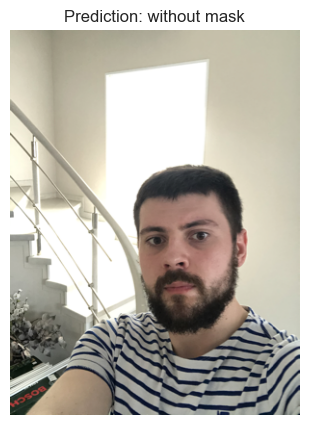

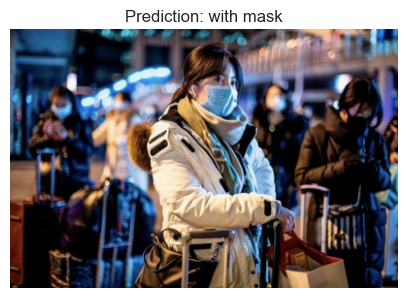

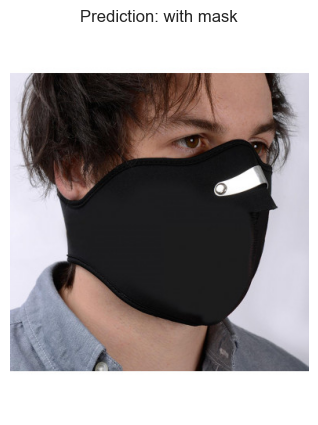

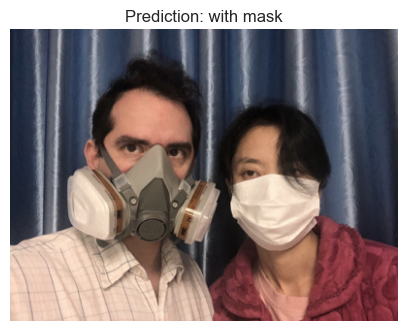

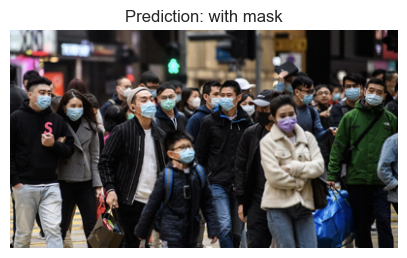

...

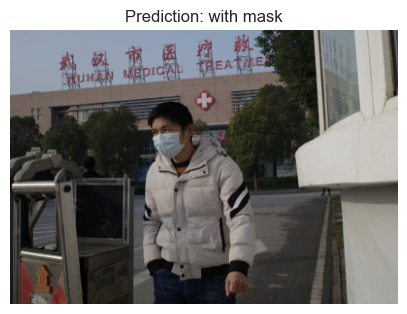

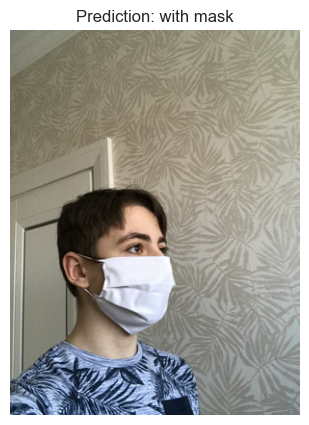

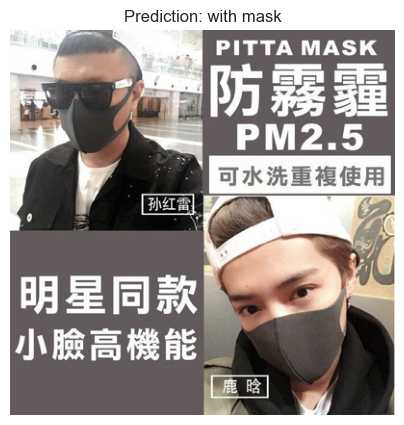

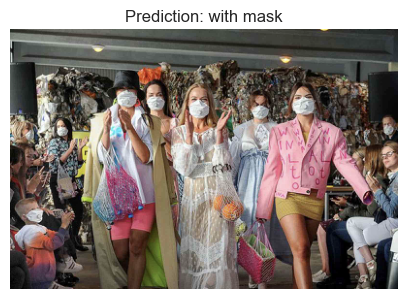

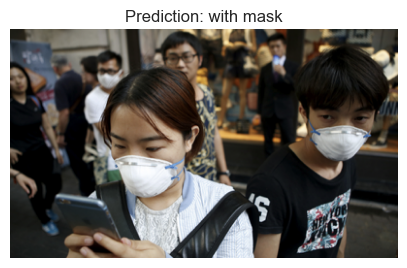

In [43]:
import os
import cv2
import numpy as np
import joblib
import matplotlib.pyplot as plt
import random

# Load the scaler, PCA, and model from saved files
scaler = joblib.load('models/scaler.joblib')
pca = joblib.load('models/pca_transformer.joblib')
model = joblib.load('models/face_mask_detection_model.joblib')

# Define the folder containing the images
image_folder = 'dataset/images'

# Function to preprocess the image
def preprocess_image(image_path, img_size=(64, 64)):
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    img = cv2.resize(img, img_size)
    img = img.flatten()
    return img

# Prepare the image for the model
def prepare_image_for_model(image_path, scaler, pca, img_size=(64, 64)):
    img = preprocess_image(image_path, img_size)
    img = img.reshape(1, -1)  # Reshape for scaler
    img_scaled = scaler.transform(img)  # Standardize
    img_pca = pca.transform(img_scaled)  # Apply PCA
    return img_pca

# Function to process a random subset of images in the folder and classify them, displaying each image with its label
def classify_and_display_images(folder_path, scaler, pca, model, num_images=10):
    image_files = os.listdir(folder_path)
    random.shuffle(image_files)  # Shuffle the list of files
    processed_count = 0
    
    for img_file in image_files:
        if img_file.lower().endswith(('.png', '.jpg', '.jpeg')) and processed_count < num_images:  # Process only a subset
            img_path = os.path.join(folder_path, img_file)
            img_pca = prepare_image_for_model(img_path, scaler, pca)
            prediction = model.predict(img_pca)
            label = label_map[prediction[0]]

            # Display the image and its prediction
            img = cv2.imread(img_path)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert to RGB for plotting
            plt.figure(figsize=(5, 5))
            plt.imshow(img)
            plt.title(f"Prediction: {label}")
            plt.axis('off')
            plt.show()

            processed_count += 1  # Increment the count of processed images

# Mapping from model output to human-readable labels
label_map = {0: 'without mask', 1: 'with mask', 2: 'mask weared incorrect'}

# Specify the number of images you want to process each time
num_images_to_process = 50

# Classify images and display them with predictions
classify_and_display_images(image_folder, scaler, pca, model, num_images=num_images_to_process)


In [44]:
import xml.etree.ElementTree as ET

def get_label_from_xml(xml_path):
    tree = ET.parse(xml_path)
    root = tree.getroot()
    for obj in root.findall('object'):
        label = obj.find('name').text
        if label == 'with_mask':
            return 1  # 'with mask'
        elif label == 'without_mask':
            return 0  # 'without mask'
        elif label == 'mask_weared_incorrect':
            return 2  # 'mask weared incorrect'
    return None  # In case no relevant label is found


def classify_and_collect_data_with_xml(folder_path, annotation_folder, scaler, pca, model):
    predictions = []
    actual_labels = []
    for img_file in os.listdir(folder_path):
        if img_file.lower().endswith(('.png', '.jpg', '.jpeg')):
            base_filename = os.path.splitext(img_file)[0]
            xml_file = base_filename + '.xml'
            xml_path = os.path.join(annotation_folder, xml_file)
            
            actual_label = get_label_from_xml(xml_path)
            if actual_label is not None:  # Proceed only if the label could be determined
                img_path = os.path.join(folder_path, img_file)
                img_pca = prepare_image_for_model(img_path, scaler, pca)
                prediction = model.predict(img_pca)[0]
                
                predictions.append(prediction)
                actual_labels.append(actual_label)
                
    return predictions, actual_labels



image_folder = 'dataset/images'
annotation_folder = 'dataset/annotations'

predictions, actual_labels = classify_and_collect_data_with_xml(image_folder, annotation_folder, scaler, pca, model)



Accuracy: 0.91
                       precision    recall  f1-score   support

         without mask       0.90      0.44      0.59       119
            with mask       0.91      0.99      0.95       698
mask weared incorrect       0.88      1.00      0.94        36

             accuracy                           0.91       853
            macro avg       0.90      0.81      0.82       853
         weighted avg       0.91      0.91      0.90       853



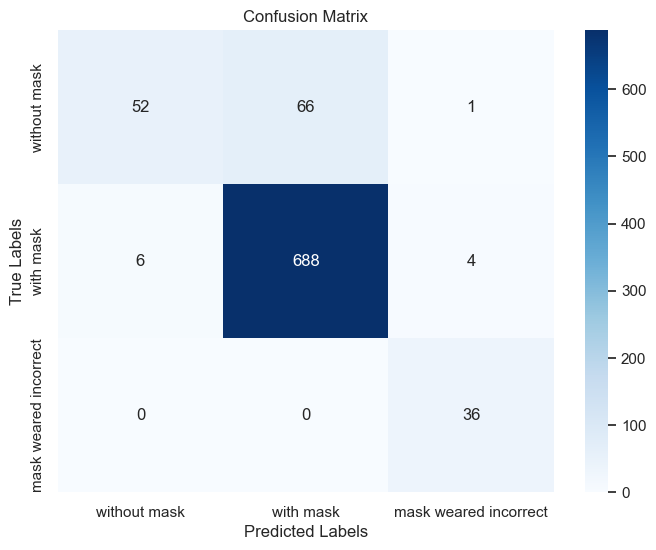

In [45]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Calculate accuracy
accuracy = accuracy_score(actual_labels, predictions)
print(f"Accuracy: {accuracy:.2f}")

# Display the classification report
print(classification_report(actual_labels, predictions, target_names=['without mask', 'with mask', 'mask weared incorrect']))


# Generate the confusion matrix
conf_matrix = confusion_matrix(actual_labels, predictions)

# Plot the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=['without mask', 'with mask', 'mask weared incorrect'], yticklabels=['without mask', 'with mask', 'mask weared incorrect'])
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()


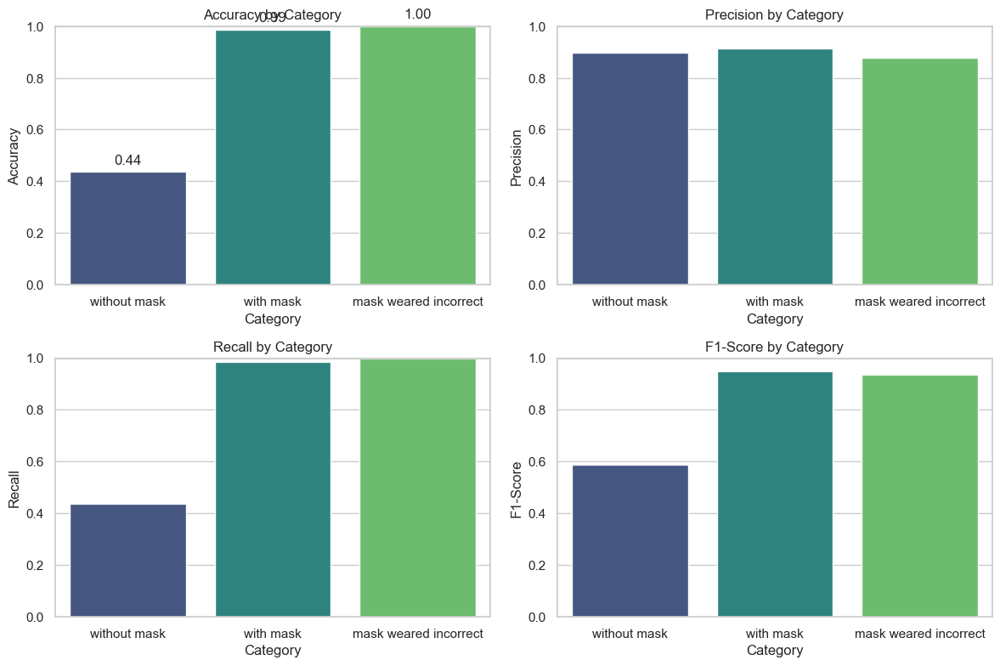

In [46]:
from sklearn.metrics import confusion_matrix
import numpy as np

# Initialize a dictionary to hold accuracy for each category
category_accuracies = {'without mask': 0, 'with mask': 0, 'mask weared incorrect': 0}

# Calculate the confusion matrix
conf_matrix = confusion_matrix(actual_labels, predictions)

# Diagonal elements of the confusion matrix correspond to correct predictions

# Calculate accuracy for each category
for i, category in enumerate(category_accuracies.keys()):
    # The accuracy per category is the number of correct predictions for that category
    # divided by the total number of instances of that category in the actual labels
    # This is equivalent to the recall for that category
    total_instances = sum(conf_matrix[i])  # Sum of instances in the row for the category
    if total_instances > 0:
        category_accuracies[category] = conf_matrix[i, i] / total_instances

# Convert accuracies to a list for plotting
categories = list(category_accuracies.keys())
accuracies = list(category_accuracies.values())


import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings('ignore', category=FutureWarning)

# Improved aesthetics with seaborn
sns.set(style="whitegrid")

# Create a more detailed DataFrame for plotting (if not already using Pandas)
import pandas as pd

data = pd.DataFrame({
    'Category': categories,
    'Accuracy': accuracies
})

# Adding more statistics - precision, recall, f1-score
from sklearn.metrics import precision_recall_fscore_support

stats = precision_recall_fscore_support(actual_labels, predictions, average=None, labels=[0, 1, 2])
data['Precision'] = stats[0]
data['Recall'] = stats[1]
data['F1-Score'] = stats[2]

# Plotting
plt.figure(figsize=(12, 8))

# Plot for accuracy
plt.subplot(2, 2, 1)
sns.barplot(x='Category', y='Accuracy', data=data, palette='viridis')
plt.ylim(0, 1)
plt.title('Accuracy by Category')

# Adding text annotations for accuracy
for index, row in data.iterrows():
    plt.text(index, row['Accuracy'] + 0.02, f"{row['Accuracy']:.2f}", ha='center', va='bottom')

# Plot for precision
plt.subplot(2, 2, 2)
sns.barplot(x='Category', y='Precision', data=data, palette='viridis')
plt.ylim(0, 1)
plt.title('Precision by Category')

# Plot for recall
plt.subplot(2, 2, 3)
sns.barplot(x='Category', y='Recall', data=data, palette='viridis')
plt.ylim(0, 1)
plt.title('Recall by Category')

# Plot for F1-Score
plt.subplot(2, 2, 4)
sns.barplot(x='Category', y='F1-Score', data=data, palette='viridis')
plt.ylim(0, 1)
plt.title('F1-Score by Category')

plt.tight_layout()
plt.show()

